In [14]:
# python
from pathlib import Path

# from pypi
from torch import nn
from torch.utils.data import DataLoader, Dataset
from torchvision import transforms as T
from torchvision import datasets
from torchvision.utils import make_grid
from tqdm import tqdm
from torch.optim import Adam

import matplotlib.pyplot as pyplot
import torch
import matplotlib.pyplot as plt
import os
from PIL import Image
from torch.autograd import Variable
import imageio
from torch.autograd import grad as torch_grad
import numpy as np

# Dataset

In [15]:
class AnimeFacesDataset(Dataset):
    def __init__(self, root_dir, transform = None):
        super().__init__()
        self.root_dir = root_dir
        self.img_filename_list = []
        for i in os.listdir(root_dir):
            if i.endswith('.png') or i.endswith('.jpg') or i.endswith('.jpeg'):
                self.img_filename_list.append(i)
        self.transform = transform
        
    def __len__(self):
        return len(self.img_filename_list)
    
    def __getitem__(self, idx):
        img_path = os.path.join(self.root_dir, self.img_filename_list[idx])
        img = Image.open(img_path)
        
        if self.transform:
            img = self.transform(img)
        
        return img

# Wasserstein GAN

In [16]:
def weights_init(m):
    if isinstance(m, nn.Conv2d) or isinstance(m, nn.ConvTranspose2d):
        torch.nn.init.normal_(m.weight, 0.0, 0.02)
    if isinstance(m, nn.BatchNorm2d):
        torch.nn.init.normal_(m.weight, 0.0, 0.02)
        torch.nn.init.constant_(m.bias, 0)
    return

In [17]:
def ConvLayer(in_channels, out_channels, kernel_size = 4, stride = 2, padding = 1, bias = True):
    return nn.Sequential(
        nn.Conv2d(in_channels, out_channels, kernel_size = kernel_size, stride = stride, padding = padding, bias = bias),
#         nn.InstanceNorm2d(out_channels, affine = True),
        nn.BatchNorm2d(out_channels),
        nn.LeakyReLU(0.2, inplace = True),
#         nn.Dropout(p=0.2, inplace=False)
    )

def DeConvLayer(in_channels, out_channels, kernel_size = 4, stride = 2, padding = 1, bias = True):
    return nn.Sequential(
        nn.ConvTranspose2d(in_channels, out_channels, kernel_size = kernel_size, stride = stride, padding = padding, bias = bias, ),
#         nn.InstanceNorm2d(out_channels, affine = True),
        nn.BatchNorm2d(out_channels),
        nn.ReLU(inplace = True)
    )


In [18]:
class GeneratorModel(nn.Module):
    def __init__(self, in_channels, first_hidden_channels, out_channels):
        super().__init__()
        self.model = nn.Sequential(
            DeConvLayer(in_channels, first_hidden_channels, 4, 2, 0),
            DeConvLayer(first_hidden_channels, first_hidden_channels // 2, 4, 2, 1),
            DeConvLayer(first_hidden_channels//2, first_hidden_channels // 4, 4, 2, 1),
            DeConvLayer(first_hidden_channels // 4, first_hidden_channels // 8, 4, 2, 1),
            nn.ConvTranspose2d(first_hidden_channels // 8, out_channels, 4, 2, 1, bias = True),
            nn.Tanh()
        )
        
    def forward(self, x):
        return self.model(x)

In [19]:
class DiscriminatorModel(nn.Module):
    def __init__(self, in_channels, first_hidden_channels = 64):
        super().__init__()
        self.model = nn.Sequential(
            ConvLayer(in_channels, first_hidden_channels, 4, 2, 1),
            ConvLayer(first_hidden_channels, first_hidden_channels * 2, 4, 2, 1),
            ConvLayer(first_hidden_channels * 2, first_hidden_channels * 4, 4, 2, 1),
            ConvLayer(first_hidden_channels * 4, first_hidden_channels * 8, 4, 2, 1),
            nn.Conv2d(first_hidden_channels * 8, 1, kernel_size = 4, stride = 1, padding = 0),

#             nn.Conv2d(first_hidden_channels * 8, first_hidden_channels * 16, kernel_size = 4, stride = 1, padding = 0),
#             nn.Flatten(),
#             nn.Linear(first_hidden_channels * 16, 1),
#             nn.Sigmoid()
        )
        
    def forward(self, x):
        return self.model(x)
    

In [20]:
# # model = DiscriminatorModel(3)
# model = GeneratorModel(100)
# # x = torch.rand(2, 3, 64,64)
# x = torch.rand(2, 100, 5,5)
# model(x).shape


# Parameters

In [21]:
root_dir = '/kaggle/input/anime-faces/data'
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
img_size = 64
batch_size = 512
num_workers = os.cpu_count()

lr = 0.0001
beta1 = 0.5
gradient_penalty_weight = 10

# DataLoader

In [22]:
transform = T.Compose(
    [
        T.Resize(img_size),
        T.ToTensor(),
        T.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])
#         T.Normalize(mean = [0.485, 0.456, 0.406], std = [0.229, 0.224, 0.225]),
    ]
)
train_dataset = AnimeFacesDataset(root_dir, transform)
train_dataloader = DataLoader(train_dataset, batch_size = batch_size, shuffle = True, num_workers = num_workers, drop_last = True)


In [23]:
gen_in_channels = 100
gen_hidden_channels = 512
gen_out_channels = dis_in_channels = 3
dis_hidden_channels = 64
gen_model = GeneratorModel(gen_in_channels, gen_hidden_channels, gen_out_channels).to(device)
dis_model = DiscriminatorModel(dis_in_channels, dis_hidden_channels).to(device)

# gen_model.apply(weights_init)
# dis_model.apply(weights_init)

dis_optim = Adam(dis_model.parameters(), lr=lr, betas=(beta1, 0.999))
gen_optim = Adam(gen_model.parameters(), lr=lr, betas=(beta1, 0.999))


In [25]:
noise_size = (batch_size, gen_in_channels,1,1)
label_size = (batch_size, 1, 1, 1)
fixed_noise = torch.randn(noise_size, device=device)
img_list = []
dis_update_repeats = 5
interation = 0

Epoch 1/100: 100%|██████████████████████████████████████████████████| 42/42 [00:27<00:00,  1.52it/s]


Epoch: 1/100: D Loss: -3.8347, G loss:  565.7551


Epoch 2/100: 100%|██████████████████████████████████████████████████| 42/42 [00:27<00:00,  1.55it/s]


Epoch: 2/100: D Loss: -3.8713, G loss:  566.4150


Epoch 3/100: 100%|██████████████████████████████████████████████████| 42/42 [00:26<00:00,  1.57it/s]


Epoch: 3/100: D Loss: -4.4513, G loss:  637.2055


Epoch 4/100: 100%|██████████████████████████████████████████████████| 42/42 [00:27<00:00,  1.54it/s]


Epoch: 4/100: D Loss: -4.4647, G loss:  565.0289


Epoch 5/100: 100%|██████████████████████████████████████████████████| 42/42 [00:26<00:00,  1.57it/s]


Epoch: 5/100: D Loss: -4.7884, G loss:  635.1538


Epoch 6/100: 100%|██████████████████████████████████████████████████| 42/42 [00:26<00:00,  1.56it/s]


Epoch: 6/100: D Loss: -4.2747, G loss:  563.7676


Epoch 7/100: 100%|██████████████████████████████████████████████████| 42/42 [00:27<00:00,  1.55it/s]


Epoch: 7/100: D Loss: -4.7368, G loss:  563.9609


Epoch 8/100: 100%|██████████████████████████████████████████████████| 42/42 [00:28<00:00,  1.49it/s]


Epoch: 8/100: D Loss: -4.8605, G loss:  633.6193


Epoch 9/100: 100%|██████████████████████████████████████████████████| 42/42 [00:28<00:00,  1.49it/s]


Epoch: 9/100: D Loss: -4.7549, G loss:  563.2314


Epoch 10/100: 100%|█████████████████████████████████████████████████| 42/42 [00:27<00:00,  1.53it/s]


Epoch: 10/100: D Loss: -5.1203, G loss:  635.0508


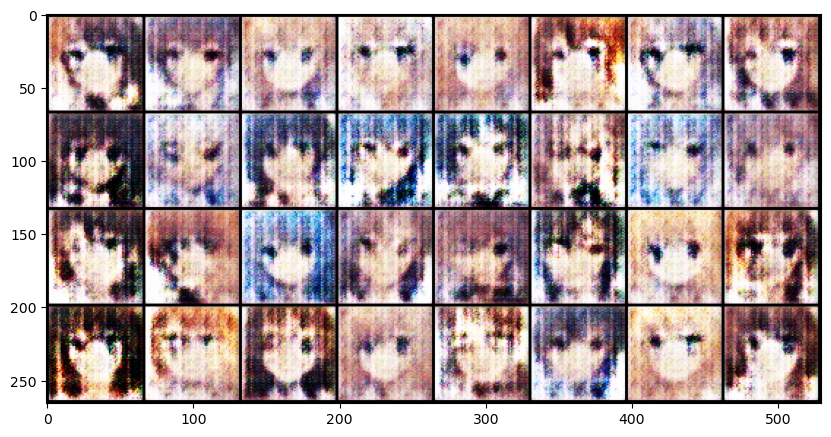

Epoch 11/100: 100%|█████████████████████████████████████████████████| 42/42 [00:28<00:00,  1.49it/s]


Epoch: 11/100: D Loss: -5.3608, G loss:  563.5018


Epoch 12/100: 100%|█████████████████████████████████████████████████| 42/42 [00:27<00:00,  1.52it/s]


Epoch: 12/100: D Loss: -5.3363, G loss:  561.9509


Epoch 13/100: 100%|█████████████████████████████████████████████████| 42/42 [00:28<00:00,  1.50it/s]


Epoch: 13/100: D Loss: -6.0909, G loss:  630.9354


Epoch 14/100: 100%|█████████████████████████████████████████████████| 42/42 [00:26<00:00,  1.57it/s]


Epoch: 14/100: D Loss: -5.7286, G loss:  560.6942


Epoch 15/100: 100%|█████████████████████████████████████████████████| 42/42 [00:27<00:00,  1.52it/s]


Epoch: 15/100: D Loss: -5.9898, G loss:  629.8308


Epoch 16/100: 100%|█████████████████████████████████████████████████| 42/42 [00:27<00:00,  1.54it/s]


Epoch: 16/100: D Loss: -5.6326, G loss:  560.3552


Epoch 17/100: 100%|█████████████████████████████████████████████████| 42/42 [00:28<00:00,  1.49it/s]


Epoch: 17/100: D Loss: -6.1986, G loss:  560.4356


Epoch 18/100: 100%|█████████████████████████████████████████████████| 42/42 [00:26<00:00,  1.57it/s]


Epoch: 18/100: D Loss: -6.4204, G loss:  629.4471


Epoch 19/100: 100%|█████████████████████████████████████████████████| 42/42 [00:28<00:00,  1.50it/s]


Epoch: 19/100: D Loss: -6.3077, G loss:  557.6226


Epoch 20/100: 100%|█████████████████████████████████████████████████| 42/42 [00:27<00:00,  1.50it/s]


Epoch: 20/100: D Loss: -6.7426, G loss:  628.4925


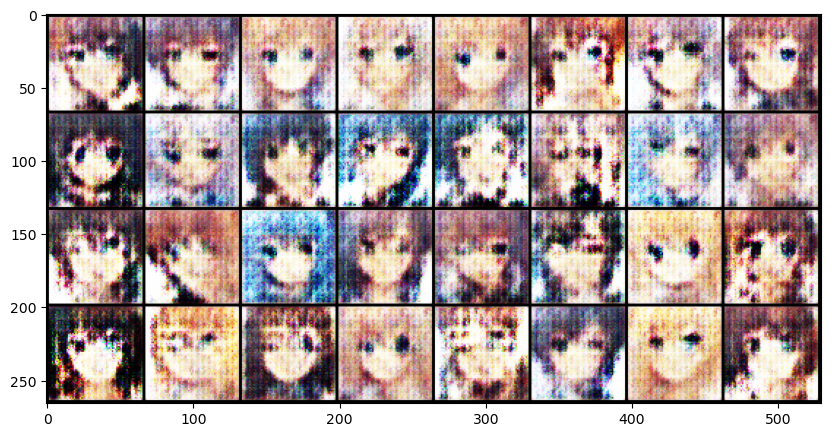

Epoch 21/100: 100%|█████████████████████████████████████████████████| 42/42 [00:26<00:00,  1.58it/s]


Epoch: 21/100: D Loss: -7.0876, G loss:  557.8395


Epoch 22/100: 100%|█████████████████████████████████████████████████| 42/42 [00:26<00:00,  1.58it/s]


Epoch: 22/100: D Loss: -7.0899, G loss:  558.7696


Epoch 23/100: 100%|█████████████████████████████████████████████████| 42/42 [00:26<00:00,  1.57it/s]


Epoch: 23/100: D Loss: -7.2017, G loss:  627.4332


Epoch 24/100: 100%|█████████████████████████████████████████████████| 42/42 [00:26<00:00,  1.58it/s]


Epoch: 24/100: D Loss: -7.3498, G loss:  557.7960


Epoch 25/100: 100%|█████████████████████████████████████████████████| 42/42 [00:26<00:00,  1.58it/s]


Epoch: 25/100: D Loss: -8.1523, G loss:  626.3978


Epoch 26/100: 100%|█████████████████████████████████████████████████| 42/42 [00:26<00:00,  1.56it/s]


Epoch: 26/100: D Loss: -7.3215, G loss:  556.6686


Epoch 27/100: 100%|█████████████████████████████████████████████████| 42/42 [00:26<00:00,  1.58it/s]


Epoch: 27/100: D Loss: -7.3195, G loss:  556.0420


Epoch 28/100: 100%|█████████████████████████████████████████████████| 42/42 [00:26<00:00,  1.57it/s]


Epoch: 28/100: D Loss: -8.3623, G loss:  624.3177


Epoch 29/100: 100%|█████████████████████████████████████████████████| 42/42 [00:28<00:00,  1.49it/s]


Epoch: 29/100: D Loss: -6.5527, G loss:  553.8322


Epoch 30/100: 100%|█████████████████████████████████████████████████| 42/42 [00:26<00:00,  1.56it/s]


Epoch: 30/100: D Loss: -7.9370, G loss:  622.5115


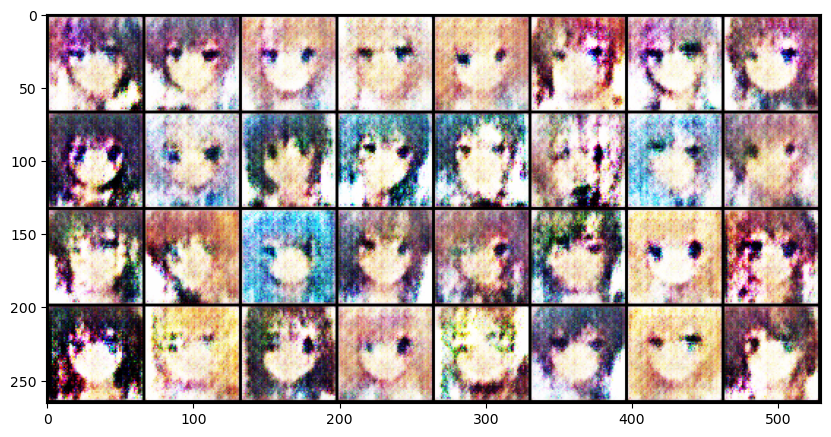

Epoch 31/100: 100%|█████████████████████████████████████████████████| 42/42 [00:29<00:00,  1.45it/s]


Epoch: 31/100: D Loss: -7.8099, G loss:  553.3566


Epoch 32/100: 100%|█████████████████████████████████████████████████| 42/42 [00:27<00:00,  1.55it/s]


Epoch: 32/100: D Loss: -8.9940, G loss:  554.1012


Epoch 33/100: 100%|█████████████████████████████████████████████████| 42/42 [00:26<00:00,  1.56it/s]


Epoch: 33/100: D Loss: -8.2446, G loss:  621.5088


Epoch 34/100: 100%|█████████████████████████████████████████████████| 42/42 [00:26<00:00,  1.58it/s]


Epoch: 34/100: D Loss: -8.3882, G loss:  552.3304


Epoch 35/100: 100%|█████████████████████████████████████████████████| 42/42 [00:26<00:00,  1.58it/s]


Epoch: 35/100: D Loss: -9.5688, G loss:  621.0199


Epoch 36/100: 100%|█████████████████████████████████████████████████| 42/42 [00:26<00:00,  1.58it/s]


Epoch: 36/100: D Loss: -8.7742, G loss:  549.8568


Epoch 37/100: 100%|█████████████████████████████████████████████████| 42/42 [00:26<00:00,  1.58it/s]


Epoch: 37/100: D Loss: -11.1151, G loss:  550.9764


Epoch 38/100: 100%|█████████████████████████████████████████████████| 42/42 [00:26<00:00,  1.58it/s]


Epoch: 38/100: D Loss: -9.8000, G loss:  619.5474


Epoch 39/100: 100%|█████████████████████████████████████████████████| 42/42 [00:26<00:00,  1.56it/s]


Epoch: 39/100: D Loss: -9.1752, G loss:  548.7713


Epoch 40/100: 100%|█████████████████████████████████████████████████| 42/42 [00:27<00:00,  1.55it/s]


Epoch: 40/100: D Loss: -10.1540, G loss:  616.3567


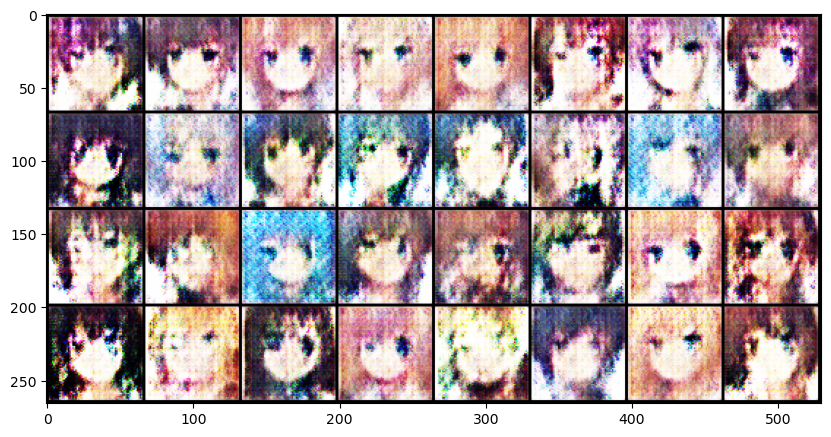

Epoch 41/100: 100%|█████████████████████████████████████████████████| 42/42 [00:28<00:00,  1.47it/s]


Epoch: 41/100: D Loss: -10.5072, G loss:  546.5496


Epoch 42/100: 100%|█████████████████████████████████████████████████| 42/42 [00:27<00:00,  1.53it/s]


Epoch: 42/100: D Loss: -10.8685, G loss:  546.6995


Epoch 43/100: 100%|█████████████████████████████████████████████████| 42/42 [00:27<00:00,  1.53it/s]


Epoch: 43/100: D Loss: -9.2081, G loss:  614.9829


Epoch 44/100: 100%|█████████████████████████████████████████████████| 42/42 [00:27<00:00,  1.55it/s]


Epoch: 44/100: D Loss: -8.3671, G loss:  545.9488


Epoch 45/100: 100%|█████████████████████████████████████████████████| 42/42 [00:29<00:00,  1.44it/s]


Epoch: 45/100: D Loss: -9.5963, G loss:  611.6057


Epoch 46/100: 100%|█████████████████████████████████████████████████| 42/42 [00:29<00:00,  1.45it/s]


Epoch: 46/100: D Loss: -9.2612, G loss:  543.9325


Epoch 47/100: 100%|█████████████████████████████████████████████████| 42/42 [00:28<00:00,  1.45it/s]


Epoch: 47/100: D Loss: -10.4539, G loss:  542.9188


Epoch 48/100: 100%|█████████████████████████████████████████████████| 42/42 [00:28<00:00,  1.48it/s]


Epoch: 48/100: D Loss: -9.1254, G loss:  610.3702


Epoch 49/100: 100%|█████████████████████████████████████████████████| 42/42 [00:29<00:00,  1.43it/s]


Epoch: 49/100: D Loss: -11.0840, G loss:  541.5959


Epoch 50/100: 100%|█████████████████████████████████████████████████| 42/42 [00:28<00:00,  1.48it/s]


Epoch: 50/100: D Loss: -9.9507, G loss:  608.1185


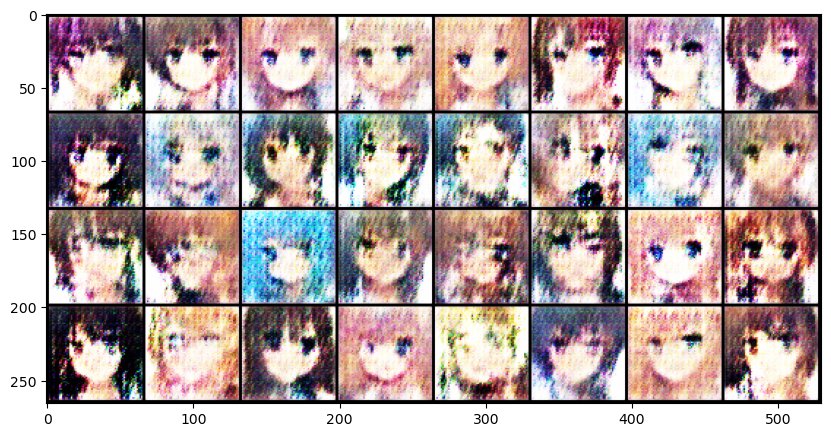

Epoch 51/100: 100%|█████████████████████████████████████████████████| 42/42 [00:27<00:00,  1.53it/s]


Epoch: 51/100: D Loss: -11.5217, G loss:  539.8009


Epoch 52/100: 100%|█████████████████████████████████████████████████| 42/42 [00:30<00:00,  1.39it/s]


Epoch: 52/100: D Loss: -11.1788, G loss:  538.1106


Epoch 53/100: 100%|█████████████████████████████████████████████████| 42/42 [00:30<00:00,  1.40it/s]


Epoch: 53/100: D Loss: -12.1895, G loss:  604.4458


Epoch 54/100: 100%|█████████████████████████████████████████████████| 42/42 [00:29<00:00,  1.42it/s]


Epoch: 54/100: D Loss: -9.0372, G loss:  537.6752


Epoch 55/100: 100%|█████████████████████████████████████████████████| 42/42 [00:27<00:00,  1.51it/s]


Epoch: 55/100: D Loss: -12.5844, G loss:  603.1958


Epoch 56/100: 100%|█████████████████████████████████████████████████| 42/42 [00:28<00:00,  1.47it/s]


Epoch: 56/100: D Loss: -11.0383, G loss:  533.2129


Epoch 57/100: 100%|█████████████████████████████████████████████████| 42/42 [00:30<00:00,  1.36it/s]


Epoch: 57/100: D Loss: -11.6010, G loss:  532.0717


Epoch 58/100: 100%|█████████████████████████████████████████████████| 42/42 [00:30<00:00,  1.40it/s]


Epoch: 58/100: D Loss: -9.0326, G loss:  598.2043


Epoch 59/100: 100%|█████████████████████████████████████████████████| 42/42 [00:29<00:00,  1.41it/s]


Epoch: 59/100: D Loss: -12.0619, G loss:  532.9133


Epoch 60/100: 100%|█████████████████████████████████████████████████| 42/42 [00:27<00:00,  1.51it/s]


Epoch: 60/100: D Loss: -6.8528, G loss:  589.0837


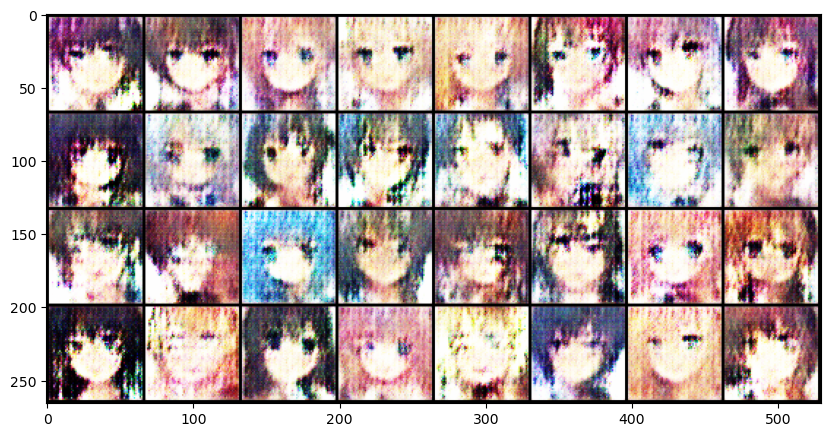

Epoch 61/100: 100%|█████████████████████████████████████████████████| 42/42 [00:28<00:00,  1.48it/s]


Epoch: 61/100: D Loss: -4.1438, G loss:  519.9471


Epoch 62/100: 100%|█████████████████████████████████████████████████| 42/42 [00:31<00:00,  1.35it/s]


Epoch: 62/100: D Loss: -4.7962, G loss:  519.0220


Epoch 63/100: 100%|█████████████████████████████████████████████████| 42/42 [00:29<00:00,  1.41it/s]


Epoch: 63/100: D Loss: -6.3054, G loss:  586.2376


Epoch 64/100: 100%|█████████████████████████████████████████████████| 42/42 [00:29<00:00,  1.43it/s]


Epoch: 64/100: D Loss: -7.5298, G loss:  521.3621


Epoch 65/100: 100%|█████████████████████████████████████████████████| 42/42 [00:27<00:00,  1.53it/s]


Epoch: 65/100: D Loss: -8.0469, G loss:  585.7100


Epoch 66/100: 100%|█████████████████████████████████████████████████| 42/42 [00:28<00:00,  1.47it/s]


Epoch: 66/100: D Loss: -8.2540, G loss:  522.0758


Epoch 67/100: 100%|█████████████████████████████████████████████████| 42/42 [00:30<00:00,  1.38it/s]


Epoch: 67/100: D Loss: -8.6551, G loss:  519.8180


Epoch 68/100: 100%|█████████████████████████████████████████████████| 42/42 [00:29<00:00,  1.41it/s]


Epoch: 68/100: D Loss: -9.8534, G loss:  584.3462


Epoch 69/100: 100%|█████████████████████████████████████████████████| 42/42 [00:29<00:00,  1.43it/s]


Epoch: 69/100: D Loss: -10.0222, G loss:  517.9310


Epoch 70/100: 100%|█████████████████████████████████████████████████| 42/42 [00:29<00:00,  1.45it/s]


Epoch: 70/100: D Loss: -10.3565, G loss:  583.3470


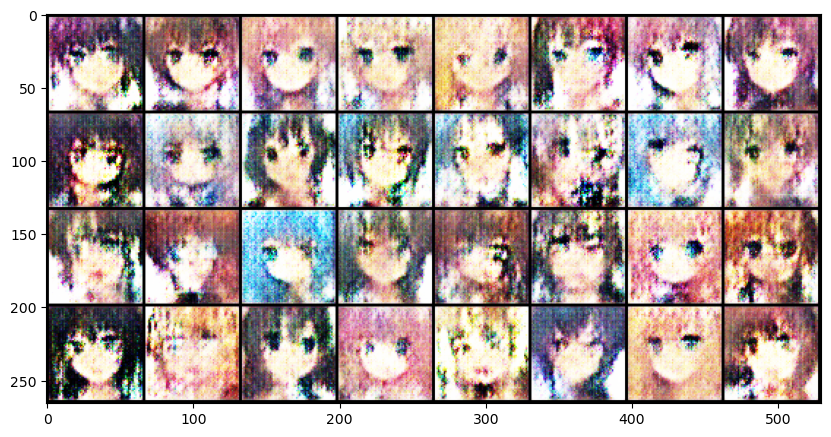

Epoch 71/100: 100%|█████████████████████████████████████████████████| 42/42 [00:26<00:00,  1.58it/s]


Epoch: 71/100: D Loss: -10.7032, G loss:  517.5341


Epoch 72/100: 100%|█████████████████████████████████████████████████| 42/42 [00:30<00:00,  1.38it/s]


Epoch: 72/100: D Loss: -10.7215, G loss:  514.4506


Epoch 73/100: 100%|█████████████████████████████████████████████████| 42/42 [00:29<00:00,  1.40it/s]


Epoch: 73/100: D Loss: -11.0173, G loss:  578.7545


Epoch 74/100: 100%|█████████████████████████████████████████████████| 42/42 [00:31<00:00,  1.33it/s]


Epoch: 74/100: D Loss: -11.4167, G loss:  514.1002


Epoch 75/100: 100%|█████████████████████████████████████████████████| 42/42 [00:30<00:00,  1.39it/s]


Epoch: 75/100: D Loss: -11.6162, G loss:  575.3805


Epoch 76/100: 100%|█████████████████████████████████████████████████| 42/42 [00:26<00:00,  1.58it/s]


Epoch: 76/100: D Loss: -10.5115, G loss:  509.8120


Epoch 77/100: 100%|█████████████████████████████████████████████████| 42/42 [00:32<00:00,  1.30it/s]


Epoch: 77/100: D Loss: -11.7408, G loss:  507.9811


Epoch 78/100: 100%|█████████████████████████████████████████████████| 42/42 [00:31<00:00,  1.33it/s]


Epoch: 78/100: D Loss: -11.9759, G loss:  570.2057


Epoch 79/100: 100%|█████████████████████████████████████████████████| 42/42 [00:33<00:00,  1.27it/s]


Epoch: 79/100: D Loss: -11.4736, G loss:  506.6784


Epoch 80/100: 100%|█████████████████████████████████████████████████| 42/42 [00:30<00:00,  1.37it/s]


Epoch: 80/100: D Loss: -11.7586, G loss:  568.7665


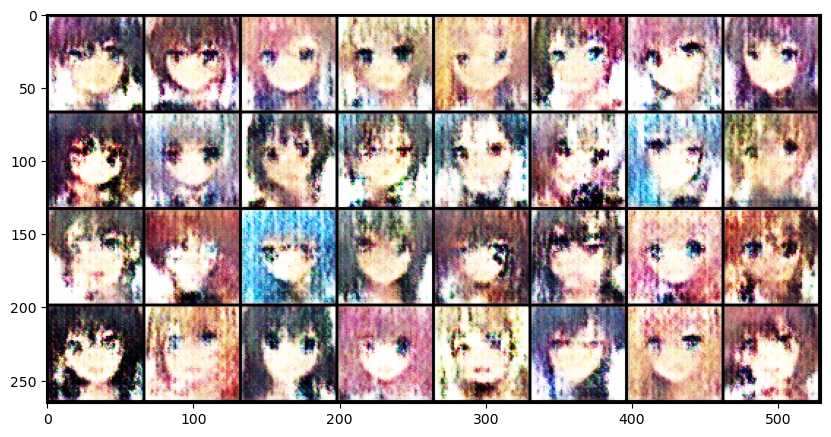

Epoch 81/100: 100%|█████████████████████████████████████████████████| 42/42 [00:26<00:00,  1.57it/s]


Epoch: 81/100: D Loss: -9.8243, G loss:  500.3061


Epoch 82/100: 100%|█████████████████████████████████████████████████| 42/42 [00:32<00:00,  1.29it/s]


Epoch: 82/100: D Loss: -7.4602, G loss:  494.0934


Epoch 83/100: 100%|█████████████████████████████████████████████████| 42/42 [00:33<00:00,  1.27it/s]


Epoch: 83/100: D Loss: -11.5254, G loss:  565.2168


Epoch 84/100: 100%|█████████████████████████████████████████████████| 42/42 [00:27<00:00,  1.55it/s]


Epoch: 84/100: D Loss: -6.5707, G loss:  489.8389


Epoch 85/100: 100%|█████████████████████████████████████████████████| 42/42 [00:27<00:00,  1.53it/s]


Epoch: 85/100: D Loss: -6.6285, G loss:  545.9874


Epoch 86/100: 100%|█████████████████████████████████████████████████| 42/42 [00:28<00:00,  1.48it/s]


Epoch: 86/100: D Loss: -9.2750, G loss:  490.1926


Epoch 87/100: 100%|█████████████████████████████████████████████████| 42/42 [00:27<00:00,  1.51it/s]


Epoch: 87/100: D Loss: -11.5247, G loss:  494.7338


Epoch 88/100: 100%|█████████████████████████████████████████████████| 42/42 [00:30<00:00,  1.37it/s]


Epoch: 88/100: D Loss: -10.9830, G loss:  554.8155


Epoch 89/100: 100%|█████████████████████████████████████████████████| 42/42 [00:31<00:00,  1.35it/s]


Epoch: 89/100: D Loss: -12.8202, G loss:  494.1616


Epoch 90/100: 100%|█████████████████████████████████████████████████| 42/42 [00:30<00:00,  1.37it/s]


Epoch: 90/100: D Loss: -10.2442, G loss:  553.2668


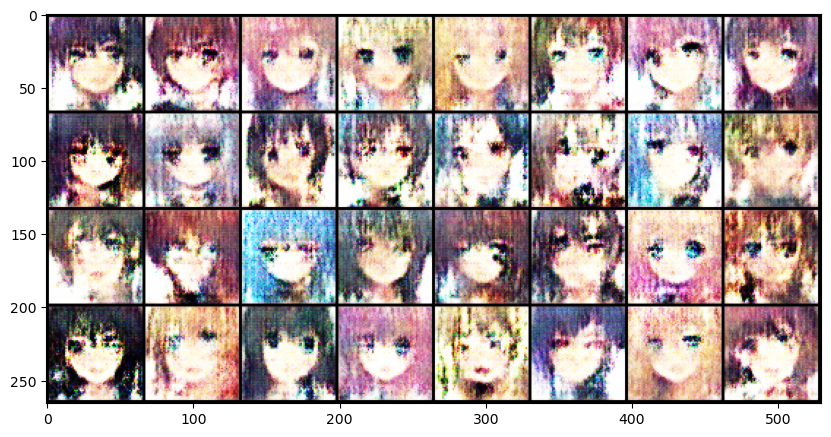

Epoch 91/100: 100%|█████████████████████████████████████████████████| 42/42 [00:29<00:00,  1.43it/s]


Epoch: 91/100: D Loss: -12.1572, G loss:  492.4930


Epoch 92/100: 100%|█████████████████████████████████████████████████| 42/42 [00:31<00:00,  1.35it/s]


Epoch: 92/100: D Loss: -9.5390, G loss:  487.7953


Epoch 93/100: 100%|█████████████████████████████████████████████████| 42/42 [00:30<00:00,  1.38it/s]


Epoch: 93/100: D Loss: -12.9800, G loss:  550.1732


Epoch 94/100: 100%|█████████████████████████████████████████████████| 42/42 [00:26<00:00,  1.57it/s]


Epoch: 94/100: D Loss: -4.0993, G loss:  475.5680


Epoch 95/100: 100%|█████████████████████████████████████████████████| 42/42 [00:28<00:00,  1.46it/s]


Epoch: 95/100: D Loss: -5.9107, G loss:  534.5484


Epoch 96/100: 100%|█████████████████████████████████████████████████| 42/42 [00:27<00:00,  1.53it/s]


Epoch: 96/100: D Loss: -8.8041, G loss:  479.1659


Epoch 97/100: 100%|█████████████████████████████████████████████████| 42/42 [00:27<00:00,  1.55it/s]


Epoch: 97/100: D Loss: -11.9815, G loss:  484.1715


Epoch 98/100: 100%|█████████████████████████████████████████████████| 42/42 [00:26<00:00,  1.57it/s]


Epoch: 98/100: D Loss: -11.2587, G loss:  542.2249


Epoch 99/100: 100%|█████████████████████████████████████████████████| 42/42 [00:27<00:00,  1.56it/s]


Epoch: 99/100: D Loss: -12.1326, G loss:  481.0448


Epoch 100/100: 100%|████████████████████████████████████████████████| 42/42 [00:27<00:00,  1.52it/s]


Epoch: 100/100: D Loss: -15.7233, G loss:  547.4282


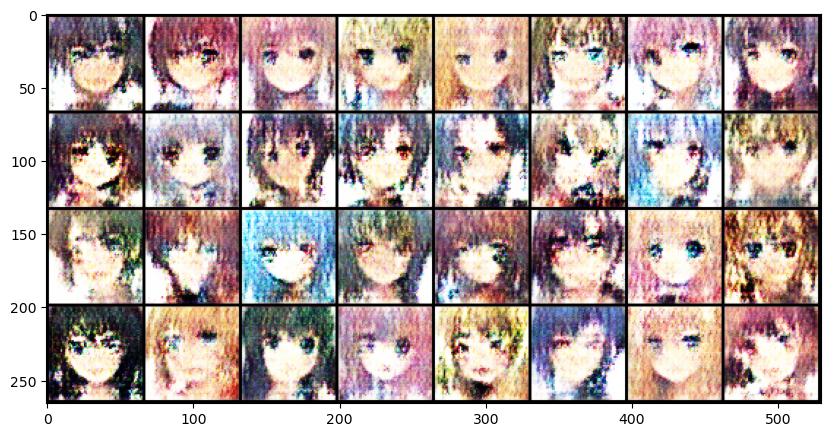

In [30]:
epochs = 100

for epoch in range(1, epochs + 1):
    gen_model.train()
    dis_model.train()
    
    total_d_loss = 0 
    total_g_loss = 0 
    
    for real_images in tqdm(train_dataloader, desc = f'Epoch {epoch}/{epochs}', ncols = 100):
        interation += 1
        # =========== Train Discriminator ===============
        # real image
        dis_optim.zero_grad()
        real_images = real_images.to(device)
        d_output_real = dis_model(real_images)

        # Fake image
        noises = torch.randn(noise_size).to(device)
        fake_images = gen_model(noises)
        d_output_fake = dis_model(fake_images)

        # Gradient Penalty
        alpha = torch.rand(batch_size, 1, 1, 1, requires_grad=True).to(device)
        mixed_images = alpha*real_images + (1 - alpha)*fake_images
        mixed_output = dis_model(mixed_images)
        gradients = torch.autograd.grad(
            outputs = mixed_output, 
            inputs = mixed_images, 
            grad_outputs = torch.ones(mixed_output.shape).to(device),
            create_graph = True, 
            retain_graph = True,
        )[0]
        gradients = gradients.view(batch_size, -1)
        gradient_penalty = torch.square(gradients.norm(2, dim = 1) - 1).mean()
        d_loss = d_output_fake.mean() - d_output_real.mean() + gradient_penalty_weight * gradient_penalty

        d_loss.backward()
        dis_optim.step()
        total_d_loss += d_loss
        
        if interation % dis_update_repeats == 0:
            # ============ Train Generator ================
            gen_optim.zero_grad()
            noises = torch.randn(noise_size).to(device)
            fake_images = gen_model(noises)
            d_output_fake = dis_model(fake_images)
            g_loss = - d_output_fake.mean()
            g_loss.backward()
            gen_optim.step()

            total_g_loss += g_loss
        
    average_d_loss = total_d_loss.item()/len(train_dataloader) 
    average_g_loss = total_g_loss.item()/len(train_dataloader)*dis_update_repeats 
    
    print(f'Epoch: {epoch}/{epochs}: D Loss: {average_d_loss : .4f}, G loss: {average_g_loss : .4f}')
    
    if epoch % 10 == 0:
        with torch.no_grad():
            fake_images = gen_model(fixed_noise).detach().cpu()
        fake_images = make_grid(fake_images[:32], padding=2, normalize=True)
        img_list.append(fake_images)
        plt.figure(figsize=(10,10))
        plt.imshow(img_list[-1].permute(1,2,0))
        plt.show()
        

# Save results

In [32]:
torch.save(dis_model.state_dict(), 'w_gan_discriminator_weights.pt')
torch.save(gen_model.state_dict(), 'w_gan_generator_weights.pt')

In [31]:
import imageio

training_progress_images = [np.transpose(255*img_grid.numpy(), (1, 2, 0)).astype(np.uint8) for img_grid in img_list]
imageio.mimsave('w_gan_200_epochs.gif', training_progress_images)

In [33]:
os.listdir()

['w_gan_generator_weights.pt',
 'w_gan_100_epochs.gif',
 'dc_gan.gif',
 '.virtual_documents',
 'w_gan_200_epochs.gif',
 'w_gan_discriminator_weights.pt',
 '__notebook_source__.ipynb']